In [1]:
# importando função que mostra imagens no jupyter notebook
from IPython.display import Image
import warnings
warnings.filterwarnings("ignore")

# Uniform Manifold Approximation and Projection (UMAP)

`UMAP` surgiu como um algoritmo de redução de dimensionalidade em 2018 [[1]](https://arxiv.org/abs/1802.03426). Até então, um dos algoritmos mais utilizados era `tSNE` que surgiu em 2008 [[2]](https://lvdmaaten.github.io/publications/papers/JMLR_2008.pdf). `UMAP` surgiu para resolver algumas desvantagens dos algoritmos até então existentes como, por exemplo, não preservar a estrutura global dos dados e serem difíceis de escalar para dimensões muito grandes de variáveis e observações.

Apesar de ser muito recente o trabalho já foi citado inúmeras vezes. Conforme pode-se constatar a seguir por uma consulta ao [Google Scholar](https://scholar.google.com/citations?user=Jb6Z_w8AAAAJ&hl=en) feita em 20/10/2021. Na figura também pode-se observar que `UMAP` é muito utilizado em algumas áreas como, por exemplo, genética.

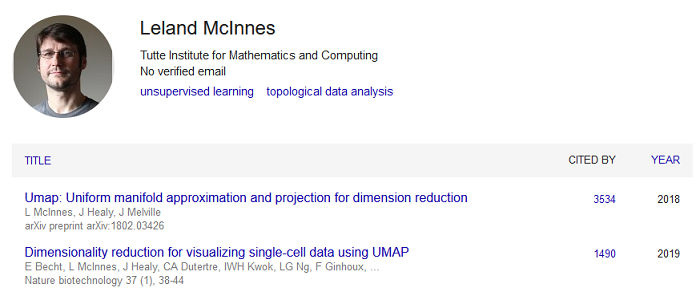

In [2]:
Image("images/citacoes.png")

Redução de dimensionalidade é uma técnica muito utilizada com dados de alta dimensionalidade para, por exemplo, observá-los e, assim,  obter insights ou reduzir ruído. Existem alguns algoritmos que fazem isso, alguns de maneira linear como `PCA` e outros de maneira não-linear como `UMAP`.

## Fundamentos Matemáticos e Estatísticos do Algoritmo

Resumidamente, `UMAP` usa os dados para obter aproximações locais de uma variedade (sobre a qual supõe-se que os dados estejam) e então usa "complexos simpliciais difusos" (fuzzy simplicial complexes) para construir uma representação topológica dos dados em alta dimensão. Essa representação é projetada em dimensão menor, preservando-se a topologia, e então `UMAP` otimiza a entropia cruzada entre as duas representações topológicas. A entropia cruzada é uma maneira de medir o erro entre as duas representações.

### Maldição da Dimensionalidade

Aumentar o número de dimensões (variáveis/features) no conjunto de dados original introduz esparsidade nos dados o que significa obter uma variedade cada vez mais fragmentada, pois todos os pontos tendem a ficar longe dos demais. `UMAP` resolve esse problema introduzindo um parâmetro $\rho$ que controla a conectividade local. Por isso, `UMAP` pode funcionar, em teoria, com qualquer número de dimensões e não precisa de uma pré redução de dimensionalidade como outros algoritmos.

Para entender isto, vamos importar algumas bibliotecas e usar o conjunto de dados [Iris](https://archive.ics.uci.edu/ml/datasets/iris) que contém 4 variáveis: largura da pétala e da sépala, e comprimento da pétala e da sépala de três espécies de flores. Vamos usar três destas variáveis, depois duas e depois uma para entender como varia a distância entre os pontos conforme mudamos a dimensão.

In [3]:
# importando bibliotecas
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
#from matplotlib.patches import Circle
from matplotlib.collections import PatchCollection
import umap.umap_ as umap
from sklearn import datasets
import networkx as nx
#import plotly.graph_objects as go
#import plotly
import plotly.express as px
import scipy
from sklearn.neighbors import KDTree
#from sklearn.metrics import pairwise_distances

#### visualizando os dados em 3D

In [4]:
df = px.data.iris()
fig = px.scatter_3d(df, x='sepal_length', y='petal_length', z='petal_width', color='species')
fig.show()

#### visualizando os dados em 2D

In [5]:
fig = px.scatter(df, x="sepal_length",
                 y="petal_length",
                 color="species",
                 marginal_x="histogram",
                 marginal_y="histogram")
fig.show()

### Como UMAP Funciona

O algoritmo assume alguns comportamentos sobre os dados:

* Os dados estão uniformemente distribuídos sobre uma variedade
* A variedade é localmente conexa

O principal objetivo é preservar a estrutura topológica da variedade.


A suposição de que os dados estão uniformemente distribuídos pode parecer artificial pois muitas situações não apresentam dados dessa forma, por isso o algoritmo usa uma técnica para alterar localmente a métrica da variedade de modo que os dados se comportem como se estivessem aproximadamente uniformemente distribuídos.

Para cada ponto da variedade constrói-se um espaço métrico discreto. Essa família de espaços métricos vai ser mergulhada em um ambiente de dimensão menor de maneira a preservar a estrutura global. A maneira de "unificar" os espaços métricos é construir um grafo, considerando cada ponto como vértice do grafo, e a partir do grafo construir complexos simpliciais difusos.

#### O que são complexos simpliciais?

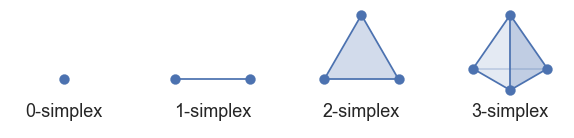

In [6]:
Image("images/simplexos.png")

Vejam um exemplo de dados que estão aproximadamente uniformemente distribuídos.

In [7]:
x = np.linspace(0, 20, 30)
y = 10 * np.sin(2 * np.pi * 0.05 *x)

data_unif= []

for i in range(0,30):
    data_unif.append([x[i], y[i], i])
data_unif = np.array(data_unif)

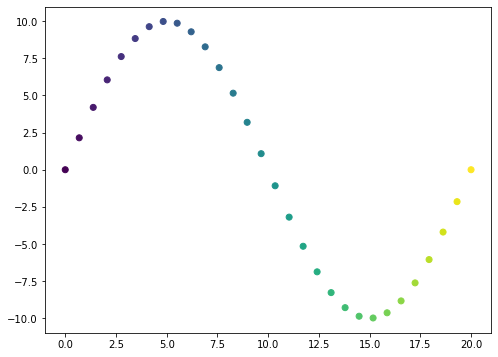

In [8]:
plt.figure(figsize=(8,6))
plt.scatter(data_unif[:,0], data_unif[:,1], c=data_unif[:,2])
plt.show()

Agora vejamos um caso mais realista em que os dados não estão uniformemente distribuídos

In [9]:
size=50
np.random.seed(42)
xs = np.concatenate([np.random.normal(loc=-np.pi, scale=np.pi/2.0, size=size), 
                     np.random.normal(loc=np.pi, scale=np.pi/2.0, size=size)])
ys = (np.sin(xs) + np.random.normal(scale=0.05, size=size*2)) * np.pi

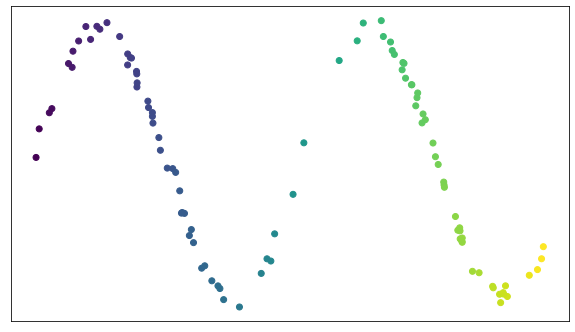

In [10]:
plt.figure(figsize=(10,8))
plt.scatter(xs, ys, c=xs, cmap='viridis')
plt.gca().set_aspect('equal')
plt.gca().set_xticks([])
plt.gca().set_yticks([])
plt.show()

Visualizando o efeito da métrica se está fosse a mesma para todos os pontos.

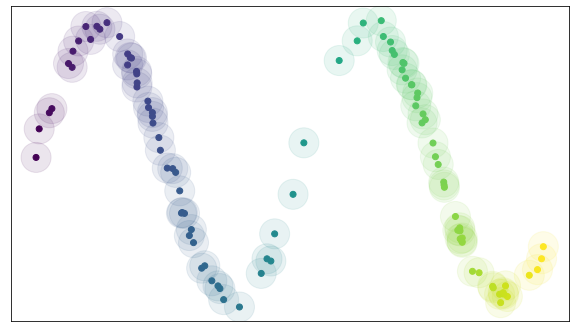

In [11]:
fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111)
ax.scatter(xs, ys, c=xs, cmap='viridis')
color_mapper = plt.cm.ScalarMappable(cmap='viridis')
color_mapper.set_clim(xs.min(), xs.max())
radii = 0.35 * np.ones(xs.shape[0])
data = np.vstack([xs, ys]).T
for idx, point in enumerate(data):
    ax.add_artist(plt.Circle((point[0], point[1]), radii[idx], 
                             color=color_mapper.to_rgba(xs[idx]), 
                             alpha=0.1, zorder=0))
ax.set_aspect('equal')
plt.gca().set_xticks([])
plt.gca().set_yticks([])
plt.savefig('how_umap_works_open_cover.png', bbox_inches='tight', pad_inches=0.1)

Neste caso, nem todos os pontos estão conectados, o que gera uma variedade desconexa.

In [12]:
data = np.vstack([xs, ys]).T
tree = KDTree(data)

In [13]:
neighbors = tree.query_radius(data, 0.7)
mat_rows = np.array([list(x) for x in neighbors])
mat_data = np.array([np.ones(len(x)).tolist() for x in neighbors])
basic_graph = scipy.sparse.lil_matrix((data.shape[0], data.shape[0]), dtype=int)
basic_graph.rows = mat_rows
basic_graph.data = mat_data
basic_graph = basic_graph.tocsr()
nx_basic_graph = nx.Graph(basic_graph)
#nx_basic_graph.remove_edges_from(nx_basic_graph.selfloop_edges())
triangles = nx.cycles.cycle_basis(nx_basic_graph)

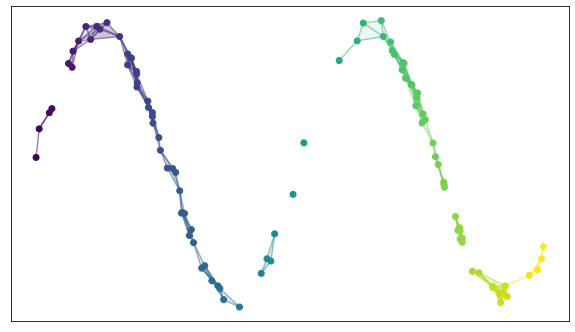

In [14]:
fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111)
ax.scatter(xs, ys, c=xs, cmap='viridis')
color_mapper = plt.cm.ScalarMappable(cmap='viridis')
color_mapper.set_clim(xs.min(), xs.max())
for i in range(xs.shape[0]):
    for j in range(i, ys.shape[0]):
        if basic_graph[i, j] > 0.0:
            ax.add_line(plt.Line2D([xs[i], xs[j]], 
                                   [ys[i], ys[j]],
                                   color=color_mapper.to_rgba(xs[i]),
                                   alpha=0.5))
triangle_patches = []
for triangle in triangles:
    triangle_patches.append(plt.Polygon(data[triangle], True))
triangle_collection = PatchCollection(triangle_patches, alpha=0.1, cmap='viridis')
triangle_collection.set_array(np.array([xs[a[0]] for a in triangles]))
ax.add_collection(triangle_collection)

ax.set_aspect('equal')
plt.gca().set_xticks([])
plt.gca().set_yticks([])
plt.show()

### Obtendo Métricas Locais

Para garantir que a variedade seja localmente conexa não se pode utilizar a mesma métrica para todos os pontos pois, devido à "maldição da dimensionalidade", podem existir regiões bem densas e outras pouco densas, de modo que a se a métrica fosse a mesma para todos os pontos a variedade acabaria provavelmente sendo desconexa.

Para contornar esse problema `UMAP` considera uma métrica que varia de ponto a ponto, de forma que regiões muito densas tenham métricas que decaem para zero muito rapidamente, enquanto regiões com poucos pontos possuem métricas que não decaem para zero tão rapidamente, de modo que todas as regiões vão estar conectadas a pelo menos uma outra região.

Vamos ilustrar a seguir como essas métricas se comportam.

In [15]:
knn_dist, knn_indices = tree.query(data, k=5)
radii = knn_dist[:, -1]

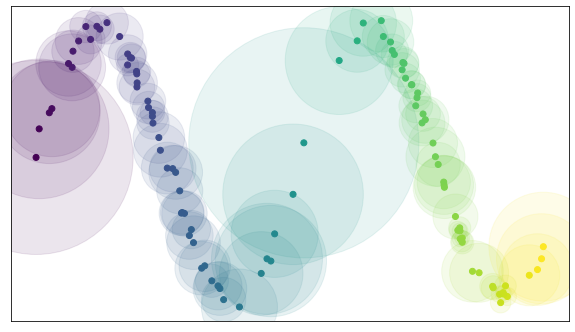

In [16]:
fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111)
ax.scatter(xs, ys, c=xs, cmap='viridis')
color_mapper = plt.cm.ScalarMappable(cmap='viridis')
color_mapper.set_clim(xs.min(), xs.max())
for idx, point in enumerate(data):
    ax.add_artist(plt.Circle((point[0], point[1]), radii[idx], 
                             color=color_mapper.to_rgba(xs[idx]), 
                             alpha=0.1, zorder=0))
ax.set_aspect('equal')
plt.gca().set_xticks([])
plt.gca().set_yticks([])
plt.show()

Criamos métricas distintas para garantir que os dados se comportassem como se estivessem uniformemente distribuídos, mas ao fazer isso temos outro problema. Existem regiões que podem ser consideradas com mais de uma métrica e devemos compatibilizar essas regiões de modo que possamos "juntar" regiões com métricas distintas e criarmos uma única variedade, conforme figura a seguir.

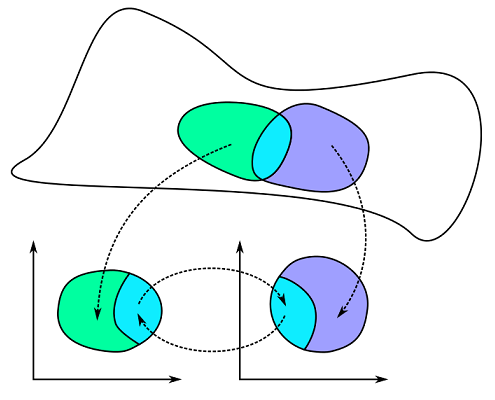

In [17]:
Image("images/variedade.png")

Seja $X = \{ x_1, \ldots, x_n \}$ um  conjunto de pontos e $d:X \times X \rightarrow \mathbb{R}_+$ uma métrica. Dado um hiperparâmetro $k$, para cada $x_i$ calcula-se os $k$ vizinhos mais próximos segundo a métrica $d$. Este cálculo é feito usando o algoritmo dos $k$ vizinhos mais próximos descendente (que escala em ordem menor que quadrado).

Para cada $x_i$ define-se $\rho_i = min \{ d(x_i, x_j); 1<j<k, d(x_i,x_j)>0 \}$, ou seja, $\rho_i$ é a distância até o vizinho mais próximo; e $\sigma_i$ o valor tal que $\sum_{j=1}^{k} exp \left( \dfrac{-max(0, d(x_i, x_j)-\rho_i)}{\sigma_i} \right) = log_2(k)$. 

$\sigma_i$ é o desvio padrão dos pontos do cluster ao qual o ponto $x_i$ pertence

A seleção do $\rho_i$ deriva da conectividade local da variedade e assegura que $x_i$ conecta com pelo menos um outro ponto. A escolha de $\sigma_i$ corresponde a um fator de normalização definindo uma métrica Riemanniana local a $x_i$.

__Resumindo:__ dados os pontos no espaço original, `UMAP` usa a distância até o vizinho mais próximo, para cada ponto $x_i$, para obter os valores de $\sigma_i$ e $\rho_i$ e assim obter um espaço métrico local para cada ponto. Após isso, usa o algoritmo `KNN` para estabelecer uma ligação entre os pontos, para assim conseguir criar o grafo.

## Construindo um Grafo

Pode-se visualizar como o `UMAP` constrói os complexos simpliciais difusos com o comando `fuzzy_simplicial_set` e uso da bilbioteca `networkx`. Basicamente, se dois círculos se interseptam então é feito uma ligação entre os pontos que estão no centro dos círculos.

Podemos pensar nos pontos de $X$ como vértices de grafo e podemos formar ligações entre esses vértices. Isto, por sua vez, pode ser visto como um simplexo difuso unidimensional associado com a métrica local de $x_i$.

Agora precisamos unificar todos esses grafos locais. Embora seja difícil compatibilizar espaços métricos com diferentes métricas, fica natural unificar os simplexos.

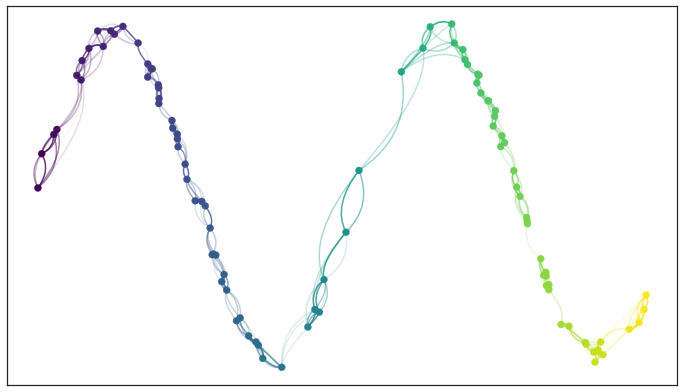

In [18]:
Image("images/pre_grafo.png")

## Construindo um Complexo Simplicial Difuso

Para construir o complexo simplicial difuso a partir do grafo iremos considerar $p_{ij}$ que é a probabilidade de que os pontos $x_i$ e $x_j$ estejam conectados no espaço original.

`UMAP` usa a seguinte simetrização para o cálculo da probabilidade $p_{ij} = p_{i|j} + p_{j|i} - p_{i|j} p_{j|i}$ esta simetrização é necessária para "colar" pontos com métricas locais diferentes. Mais especificamente, quando é criado o grafo com pesos entre entre dois pontos $x_i$ e $x_j$, este pode ter um peso diferente do grafo com pesos criado entre os pontos $x_j$ e $x_i$, por isso, é usada essa simetrização. Assim, o grafo de $A$ para $B$ e de $B$ para $A$ possuem o mesmo peso.

$p_{i|j} = exp\left( -\dfrac{d(x_i, x_j)-\rho_i}{\sigma_i} \right)$, em que $\rho_i$ é a distância de $x_i$ até seu vizinho mais próximo, e $\sigma_i$ é o desvio padrão dos pontos do cluster ao qual o ponto $x_i$ pertence, conforme havíamos visto.

Deste modo, $k = 2^{\sum_i p_{ij}}$ é o número de vizinhos mais próximos.

Além disso `UMAP` considera $q_{ij} = (1 + a(y_i - y_j)^{2b})^{-1}$, que é a probabilidade de que os pontos $y_i$ e $y_j$ estejam conectados em dimensão baixa. Os parâmetros $a$ e $b$ dependem do hiperparâmetro `min_dist` que controla a distância em que os pontos estarão no espaço de dimensão mais baixa.

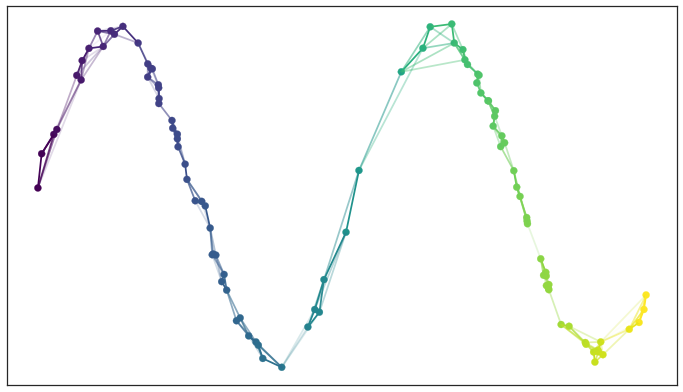

In [19]:
Image("images/grafo.png")

## Otimizando a Entropia Cruzada

A entropia cruzada, denotada por $C$, entre dois conjuntos fuzzy $(A, \mu)$ e $(A, \nu)$ é definida por $$C((A, \mu), (A, \nu)) = \sum_{a \in A} \mu(a) log\left( \dfrac{\mu(a)}{\nu(a)} \right) + (1 - \mu(a))log\left( \dfrac{1-\mu(a)}{1-\nu(a)} \right)$$

Nesta definição $\mu$ e $\nu$ são medidas de probabilidade.

O primeiro termo controla a distância entre clusters e o segundo a distância intra cluster.

Através de uma simplificação pode-se escrever a entropia cruzada na forma $$C((A, \mu), (A, \nu)) = \sum_{a \in A} \left[ \mu(a)log(\mu(a)) + (1-\mu(a))log(1-\mu(a)) \right]\\ - \sum_{a \in A} \left[ \mu(a)log(\nu(a)) + (1-\mu(a))log(1-\nu(a)) \right]$$

A primeira soma depende somente de $\mu$ que assume valores fixo durante a otimização. Portanto, a minimização da entropia cruzada depende somente do termo $- \sum_{a \in A} \left[ \mu(a)log(\nu(a)) + (1-\mu(a))log(1-\nu(a)) \right]$

Então cria-se um grafo em um espaço de dimensão menor de maneira que os dois grafos preservem certas propriedades topológicas.

## Vantagens do `UMAP`

Conforme iremos explorar posteriormente, o `UMAP` é um algoritmo mais rápido, em geral, que os demais algoritmos de redução de dimensionalidade um dos motivos é que para calcular a entropia usa-se $2^{\sum_i p_{ij}}$, diferentemente de outros algoritmos que usam uma versão parecida mas que envolve a função logarítmica (o que é computacionalmente custoso por envolver aproximações por série de Taylor).

Outro motivo é que parte dos algoritmos exige que os dados sejam normalizados de alguma maneira no espaço original (que possui dimensão alta) mas `UMAP` não necessita de nenhuma normalização para ser aplicado.

Além disso, `UMAP` pode ser aplicado diretamente para a redução de dimensionalidade, enquanto alguns algoritmo necessitam de uma pré redução de dimensionalidade, aplicando `PCA` primeiramente, por exemplo.

Sua implementação em `Python` suporta formato de matrizes esparsas, acelerando o processamento.

Outro ponto interessante é que o `UMAP` associa coordenadas em dimensão baixa usando grafo laplaciano, enquanto `tSNE` uma inicialização aleatória normal. Isto faz com que `UMAP` sofra menor alteração de execução para execução. Na verdade `UMAP` é invariante por rotação. Por conta disso o algoritmo pode ser usado para redução de   dimensionalidade/visualização ou agrupamento supervisionado.

Por isso, pode-se considerar que `UMAP` é determinístico, no sentido de que dado o mesmo input sempre vai produzir mesmo output, a menos de rotações. Isto permite acrescentar novos dados ao espaço projetado além de integrar o `UMAP` em um pipeline de um projeto.

A ideia de usar Grafo Laplaciano foi inspirada numa sugestão de que a divergência de Kullbach-Liebler (usado por `tSNE` como função custo) poderia ser equivalente a usar Grafo Laplaciano em certos casos.

Para encontrar o Grafo Laplaciano primeiro constrói-se um grafo com o uso do `KNN`, tendo o grafo pode-se construir a matrix de adjacência via matriz laplaciana. Então, calculam-se os autovalores da matriz para obter sua fatoração.

**Resumindo**

- `UMAP` começa com dados em um espaço de dimensão alta
- Encontra métricas locais para cada ponto dos dados
- Constrói um grafo a partir das métricas
- Constrói complexos simpliciais difusos com base no grafo
- Encontra uma estrutura topológica via complexos simpliciais
- Mergulha esta estrutura topológica em um espaço de dimensão mais baixa
- Otimiza o mergulho para preservar a estrutura de distâncias na representação topológica original

Até aqui, temos visto como o algoritmo funciona, mas nenhuma dessas etapas é necessária para usá-lo.

A seguir mostra-se que a utilização é bem simples e exige pouco código. A maneira de usar segue o mesmo estilo da biblioteca `scikit-learn` de modo que só se precisa instanciar um objeto da classe `umap` com seus hiperparâmetros com o comando `reducer = umap.UMAP(n_neighbors=5)` e posteriormente "treinar" o algoritmo com os dados de interesse com o comando `embed = reducer.fit_transform(data)`. Agora já é possível usar os dados no espaço projetado com o objeto `embed`.

Mostraremos a seguir como usar o algoritmo em conjuntos de dados conhecidos e iremos comparar com outros algoritmos.

## UMAP em ação

In [20]:
iris = datasets.load_iris()
df = pd.DataFrame(data=np.c_[iris['data'],
                  iris['target']],
                  columns = iris['feature_names'] + ['target'])

In [21]:
features = ['sepal length (cm)', 'sepal width (cm)', 'petal length (cm)', 'petal width (cm)']
# Separating out the features
f = df.loc[:, features].values
# Separating out the target
t = df.loc[:,['target']].values

In [22]:
reducer = umap.UMAP(n_neighbors = 15)
embed = reducer.fit_transform(f)

In [23]:
embed

array([[ 1.31459455e+01,  5.08935452e+00],
       [ 1.52971849e+01,  3.97915268e+00],
       [ 1.50756998e+01,  4.42856121e+00],
       [ 1.52264538e+01,  4.46762609e+00],
       [ 1.28579292e+01,  4.77998734e+00],
       [ 1.22111092e+01,  5.64567804e+00],
       [ 1.47385235e+01,  4.69909620e+00],
       [ 1.36146574e+01,  4.84155369e+00],
       [ 1.53102541e+01,  4.57019997e+00],
       [ 1.51834621e+01,  3.88201976e+00],
       [ 1.25133057e+01,  5.67483044e+00],
       [ 1.42607384e+01,  4.51772165e+00],
       [ 1.53625917e+01,  3.97252059e+00],
       [ 1.52865791e+01,  4.76958990e+00],
       [ 1.19717093e+01,  5.75722694e+00],
       [ 1.19083910e+01,  5.65359259e+00],
       [ 1.20742846e+01,  5.44270706e+00],
       [ 1.31302652e+01,  4.98099279e+00],
       [ 1.22539263e+01,  5.73741388e+00],
       [ 1.20053244e+01,  5.28826475e+00],
       [ 1.31247282e+01,  5.44960737e+00],
       [ 1.26202946e+01,  5.11195421e+00],
       [ 1.44763708e+01,  4.86627579e+00],
       [ 1.

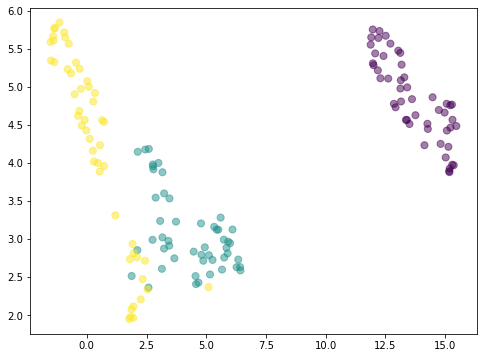

In [24]:
fig = plt.figure(figsize=(8, 6))
plt.scatter(embed[:,0], embed[:,1], c=t, cmap='viridis', s=50, alpha=0.5)
plt.show()

Vamos observar como os pontos são conectados e como fica a projeção em dimensão $2$.

In [25]:
EG,s1,r1 = umap.fuzzy_simplicial_set(embed, n_neighbors=15, random_state=42, metric='euclidean')

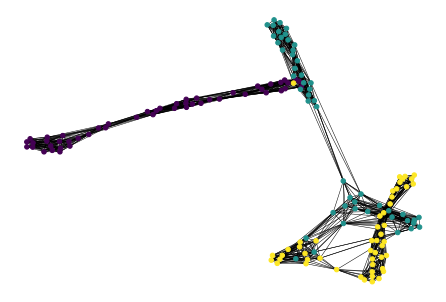

In [26]:
Graph = nx.from_scipy_sparse_matrix(EG)
my_pos = nx.spring_layout(Graph, seed=11)
nx.draw(Graph, pos= my_pos, node_color=t, with_labels=False, width=0.5, node_size=20, font_size=18)
plt.show()

### Explorando o Algoritmo

Vamos começar importando algumas bibliotecas/pacotes que serão utilizados a seguir.

In [27]:
# instalando biblioteca UMAP
# descomente e execute o código abaixo se ainda não tiver instalado a biblioteca
#!pip install umap-learn

In [28]:
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
from sklearn import datasets
import umap
from umap import plot as uplot
from keras.datasets import mnist
from babyplots import Babyplot

Para ver detalhes do algoritmo e os hiperparâmetros que estão definidos por padrão e/ou que podem ser alterados basta executar a célula abaixo.

In [61]:
?umap.UMAP

Agora, vamos carregar um conjunto de dados e ver como o algoritmo se comporta. Usaremos o conjunto `digits`, disponível na biblioteca `scikit-learn.datasets`. Este conjunto contém 5620 exemplos dos dígitos de $0$ a $9$ escritos a mão. Cada um dos exemplos é uma imagem de $8 x 8$ pixels em preto e branco. Cada pixel é um número variando de 0 a 16, em que 0 representa preto e 16 representa branco, com valores intermediários assumindo tons de cinza.

Para mais informações pode-se usar o comando `print(digits.DESCR)` depois de carregar o conjunto conforme feito a seguir.

In [30]:
digits = datasets.load_digits()

In [31]:
# podemos visualizar os dados em sua forma bruta
digits.data

array([[ 0.,  0.,  5., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ..., 10.,  0.,  0.],
       [ 0.,  0.,  0., ..., 16.,  9.,  0.],
       ...,
       [ 0.,  0.,  1., ...,  6.,  0.,  0.],
       [ 0.,  0.,  2., ..., 12.,  0.,  0.],
       [ 0.,  0., 10., ..., 12.,  1.,  0.]])

Vamos visualizar $100$ imagens de exemplo.

A figura abaixo foi adaptada da documentação do UMAP: __https://umap-learn.readthedocs.io/en/latest/basic_usage.html__

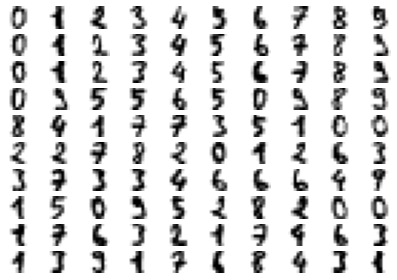

In [32]:
fig, ax_array = plt.subplots(10, 10)
axes = ax_array.flatten()
for i, ax in enumerate(axes):
    ax.imshow(digits.images[i], cmap='gray_r')
plt.setp(axes, xticks=[], yticks=[], frame_on=False)
plt.tight_layout(h_pad=0.5, w_pad=0.01)

Vamos usar `UMAP` com parâmetros padrão.

In [33]:
reducer = umap.UMAP().fit(digits.data)

Vamos visualizar como o UMAP mergulhou os dados em duas dimensões.

In [34]:
embedding = reducer.transform(digits.data)

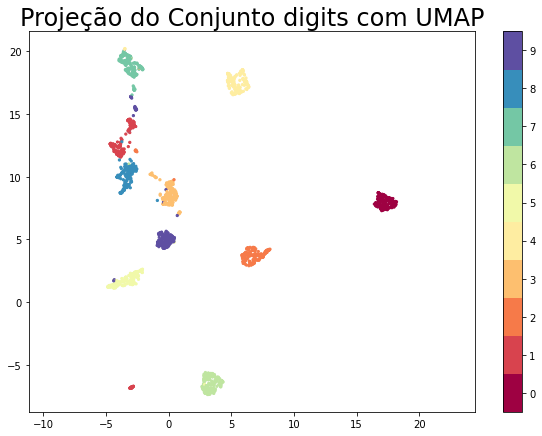

In [35]:
plt.figure(figsize=(10,7))
plt.scatter(embedding[:, 0], embedding[:, 1], c=digits.target, cmap='Spectral', s=5)
plt.gca().set_aspect('equal', 'datalim')
plt.colorbar(boundaries=np.arange(11)-0.5).set_ticks(np.arange(10))
plt.title('Projeção do Conjunto digits com UMAP', fontsize=24)
plt.show()

In [36]:
help(uplot)

Help on module umap.plot in umap:

NAME
    umap.plot

FUNCTIONS
    connectivity(umap_object, edge_bundling=None, edge_cmap='gray_r', show_points=False, labels=None, values=None, theme=None, cmap='Blues', color_key=None, color_key_cmap='Spectral', background='white', width=800, height=800)
        Plot connectivity relationships of the underlying UMAP
        simplicial set data structure. Internally UMAP will make
        use of what can be viewed as a weighted graph. This graph
        can be plotted using the layout provided by UMAP as a
        potential diagnostic view of the embedding. Currently this only works
        for 2D embeddings. While there are many optional parameters
        to further control and tailor the plotting, you need only
        pass in the trained/fit umap model to get results. This plot
        utility will attempt to do the hard work of avoiding
        overplotting issues and provide options for plotting the
        points as well as using edge bundling

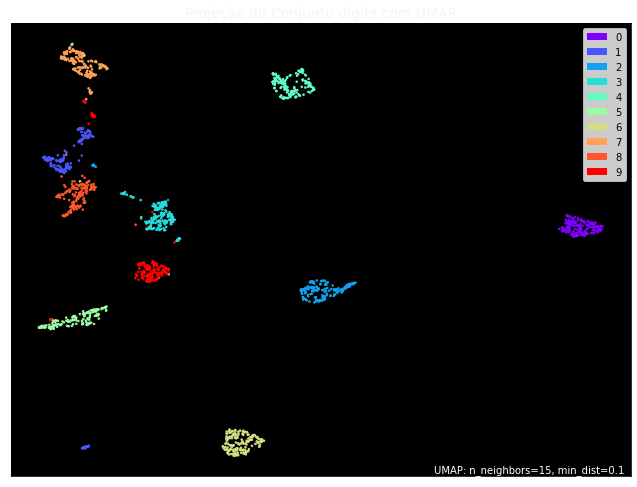

In [37]:
pm = uplot.points(reducer, labels=digits.target, width=800, height=600, theme="fire")
pm.set_title('Projeção do Conjunto digits com UMAP', fontsize=14, color="whitesmoke")
plt.show()

### Vamos avaliar a mudança do resultado de acordo com os hiperparâmetros

hiperparâmetros do UMAP:

`n_components`: dimensão do espaço alvo

`min_dist`: representa quão próximos pontos podem ser colocados juntos no espaço de dimensão menor.

`n_epochs`: número de epocas de treino usado para otimizar a representação em dimensão menor

`n_neighbors`: número de vizinhos mais próximos considerados para aproximar a métrica local. Pode ser interpretado como a escala local na qual a variedade vai ser aproximada como euclidiana.
Características da variedade que ocorrem a uma escala menor que os `n_neighbors` vizinhos mais próximos serão perdidas, e características globais podem não ser detectadas por se considerar várias regiões locais conectadas. Ou seja, `n_neighbors` representa uma troca entre características da variedade em pequena escala e larga escala.


Claramente, o hiperparâmetro `n_epochs` afeta a convergência do `UMAP`, mas para valores grandes de `n_epochs` (que é o caso frequente) praticamente nenhuma mudança deve ser observada.

Outra coisa interessante do `UMAP` é que pode-se usar várias métricas para o cálculo de distâncias, diferentemente de outros algoritmos como `tSNE`.

Além disso, o hiperparâmetro `n_components` tem papel evidente. Portanto, vamos analisar apenas a influência dos hiperparâmetros `n_neighbors` e `min_dist`, e da métrica.

In [38]:
# Criando função que avalia UMAP para variações dos hiperparâmetros n_epochs e min_dist
def vary_hyperparameters(data, n_neighbors=15, min_dist=0.1, metric='euclidean'):
    # min_dist deve ser um valor entre 0 e 1
    
    random_state = np.random.RandomState(42)
    reducer = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, random_state=random_state)
    reducer = reducer.fit(data)
    
    return reducer

É possível explicitar o hiperparâmetro `verbose=True` para acompanhar o progresso do algoritmo, como pode-se notar a seguir. No entanto, não utilizamos esse parâmetro na função para obter uma saída mais clara.

In [39]:
random_state = np.random.RandomState(42)
reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, random_state=random_state, verbose=True)
reducer = reducer.fit(digits.data)

UMAP(dens_frac=0.0, dens_lambda=0.0,
     random_state=RandomState(MT19937) at 0x228E8A05EB8, verbose=True)
Construct fuzzy simplicial set
Mon Nov  1 14:22:03 2021 Finding Nearest Neighbors
Mon Nov  1 14:22:04 2021 Finished Nearest Neighbor Search
Mon Nov  1 14:22:04 2021 Construct embedding
	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs
Mon Nov  1 14:22:23 2021 Finished embedding


Vamos criar uma malha de valores dos hiperparâmetros e avaliar a conectividade dos pontos que são usados para gerar a variedade pelo `UMAP` em cada combinação.

In [40]:
import itertools

n_n = [5, 15, 30]
m_d = [0.1, 0.5, 0.9]
combinations = list(itertools.product(n_n, m_d))

Com o código abaixo podemos ver como o `UMAP` cria um grafo para então tentar obter a estrutura da variedade sobre a qual os dados estão. Usando o código diretamente várias figuras serão exibidas uma abaixo da outra mas, para uma melhor visualização, vamos salvar todas as figuras localmente e importá-las para colocar todas juntas.

`for neighbors, dist in combinations:
    embed = vary_hyperparameters(data=digits.data, n_neighbors=neighbors, min_dist=dist)
    uplot.connectivity(embed,
                       labels=digits.target,
                       show_points=True,
                       width=400,
                       height=400,
                       background="white",
                       color_key_cmap="Paired",
                       edge_cmap="seismic_r")
    plt.savefig(f'embed={epochs}_{dist}.png', dpi=400)`

In [41]:
# Importando as imagens
import matplotlib.image as mpimg

img1 = mpimg.imread('images/connectivity1.png')
img2 = mpimg.imread('images/connectivity2.png')
img3 = mpimg.imread('images/connectivity3.png')
img4 = mpimg.imread('images/connectivity4.png')
img5 = mpimg.imread('images/connectivity5.png')
img6 = mpimg.imread('images/connectivity6.png')
img7 = mpimg.imread('images/connectivity7.png')
img8 = mpimg.imread('images/connectivity8.png')
img9 = mpimg.imread('images/connectivity9.png')

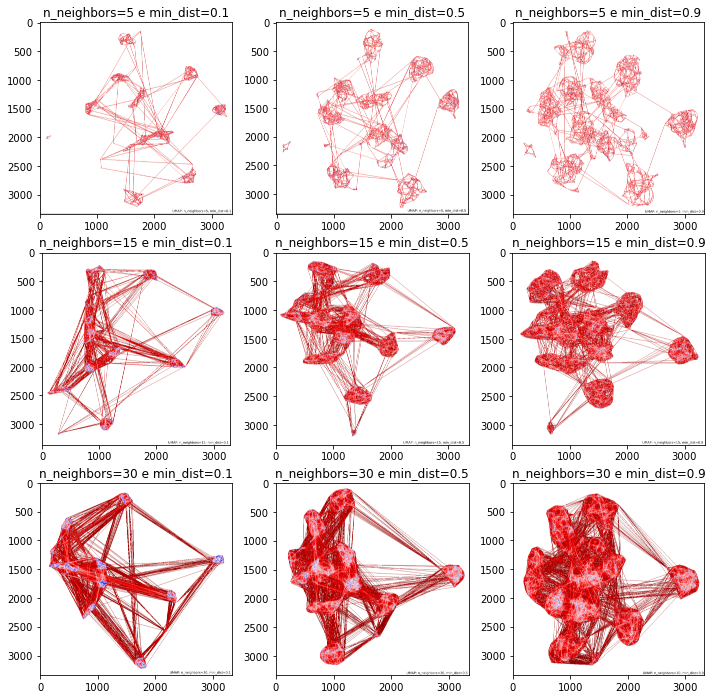

In [42]:
plt.figure(figsize=(12,12))
plt.subplot(331)
plt.title(f'n_neighbors=5 e min_dist=0.1')
plt.imshow(img1)

plt.subplot(332)
plt.title(f'n_neighbors=5 e min_dist=0.5')
plt.imshow(img2)

plt.subplot(333)
plt.title(f'n_neighbors=5 e min_dist=0.9')
plt.imshow(img3)

plt.subplot(334)
plt.title(f'n_neighbors=15 e min_dist=0.1')
plt.imshow(img4)

plt.subplot(335)
plt.title(f'n_neighbors=15 e min_dist=0.5')
plt.imshow(img5)

plt.subplot(336)
plt.title(f'n_neighbors=15 e min_dist=0.9')
plt.imshow(img6)

plt.subplot(337)
plt.title(f'n_neighbors=30 e min_dist=0.1')
plt.imshow(img7)

plt.subplot(338)
plt.title(f'n_neighbors=30 e min_dist=0.5')
plt.imshow(img8)

plt.subplot(339)
plt.title(f'n_neighbors=30 e min_dist=0.9')
plt.imshow(img9)
plt.show()

Os gráficos acima mostram a influência dos hiperparâmetro `min_dist` e `n_neighbors` na criação do grafo.

Agora vamos ver o efeito dos hiperparâmetros nos agrupamentos no espaço de mergulho. Vamos fixar o conjunto de dados na função apenas por motivos didáticos.

### ``n_neighbors``

Este parâmetro controla como `UMAP` leva em consideração estrutura global vs local dos dados. Valores baixos forçam `UMAP` a se concentrar em estruturas locais (em detrimento da estrutura global), enquanto valores grandes forçam `UMAP` a se concentrar em estruturas globais (em detrimento da estrutura local).

O valor padrão é 15.

### ``min_dist``

Este parâmetro controla quão próximo os pontos vão estar juntos no espaço de mergulho. Valores pequenos vão criar grupos mais próximos.

Este parâmetro é de interessante quando `UMAP` é usado para agrupamento, e varia de $0.0$ a $0.99$. O valor padrão é $0.1$.

In [43]:
# Criando função que avalia UMAP para variações dos hiperparâmetros n_epochs e min_dist
def vary_hp_embedding(data=digits.data, n_neighbors=15, min_dist=0.1, metric='euclidean'):
    # min_dist deve ser um valor entre 0 e 1
    random_state = np.random.RandomState(42)
    reducer = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, random_state=random_state, metric=metric)
    reducer = reducer.fit(data)
    embedding = reducer.transform(data)
    
    return embedding

Vamos criar um conjunto de dados bidimensionais para cada implementação do `UMAP`.

In [44]:
n_n = [5, 15, 30]
m_d = [0.1, 0.5, 0.9]
combinations = list(itertools.product(n_n, m_d))
embeddings = []

for n_n, m_d in combinations:
    embeddings.append([vary_hp_embedding(data=digits.data, n_neighbors=n_n, min_dist=m_d), n_n, m_d])

Finalmente, podemos plotar os gráficos juntamente para ver os efeitos dos hiperparâmetros.

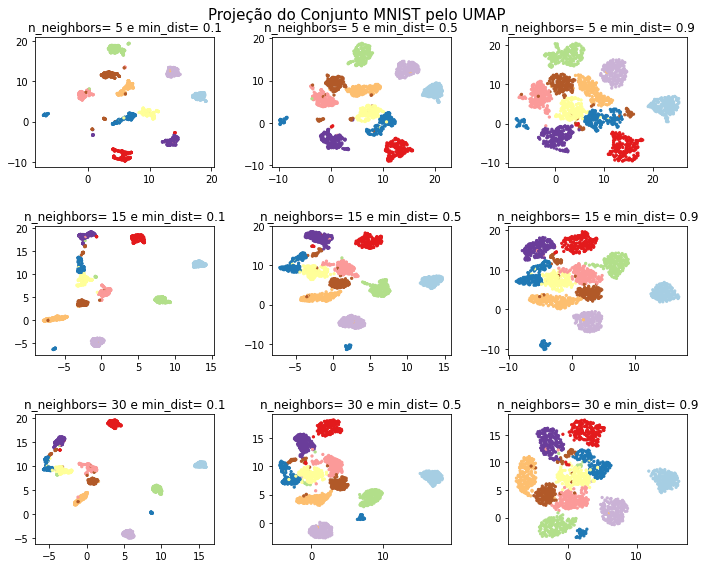

In [45]:
fig = plt.subplots(3,3, figsize=(10,8))
plt.suptitle('Projeção do Conjunto MNIST pelo UMAP', fontsize=15)

norm = mpl.colors.Normalize(vmin=0, vmax=10)
plt.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap='Paired'),
             boundaries=np.arange(11)-0.5).set_ticks(np.arange(10))

for i in range(1,10):
    axs = plt.subplot(f"33{i}")
    axs.scatter(embeddings[i-1][0][:, 0], embeddings[i-1][0][:, 1], c=digits.target, cmap='Paired', s=5)
    axs.title.set_text(f'\nn_neighbors= {embeddings[i-1][1]} e min_dist= {embeddings[i-1][2]}')

plt.tight_layout()

Agora vamos ver o efeito de uma métrica diferente.

### ``metric``

O parâmetro `metric` do `UMAP` controla a métrica calculada no espaço original dos dados e aceita, além de métricas definidas pelo usuário, as seguintes métricas conhecidas:

**Métricas com estilo de Minkowski**
* euclidean
* manhattan
* chebyshev
* minkowski

**Métricas Espaciais**
* canberra
* braycurtis
* haversine

**Métricas Espaciais Normalizadas**
* mahalanobis
* wminkowski
* seuclidean

**Métricas Angulares e de Correlação**
* cosine
* correlation

**Métricas para dados binários**
* hamming
* jaccard
* dice
* russelrao
* kulsinski
* rogerstanimoto
* sokalmichener
* sokalsneath
* yule

Apenas a título de ilustração vamos variar a métrica e fixar os hiperparâmetros `n_neighbors=15` e `min_dist=0.5`.

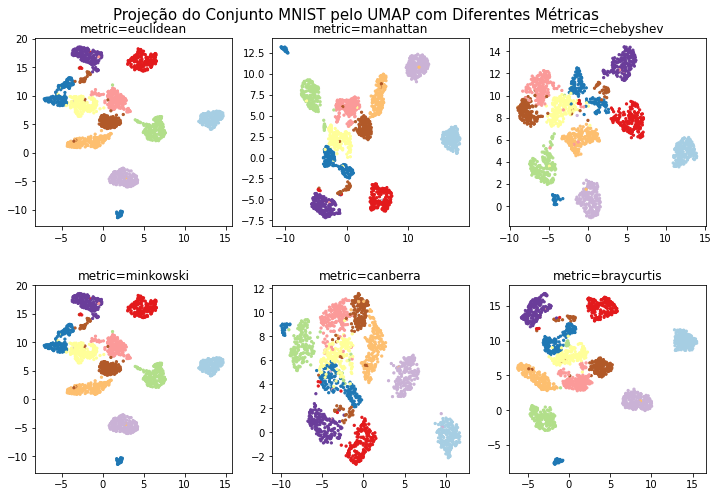

In [46]:
fig = plt.subplots(3,4, figsize=(10,7))
plt.suptitle('Projeção do Conjunto MNIST pelo UMAP com Diferentes Métricas\n', fontsize=15)

#norm = mpl.colors.Normalize(vmin=0, vmax=10)
#plt.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap='Paired'),
#             ax=axs,
#            boundaries=np.arange(11)-0.5).set_ticks(np.arange(10))

metrics_list = ['euclidean', 'manhattan', 'chebyshev', 'minkowski', 'canberra', 'braycurtis']

for i in range(len(metrics_list)):
    embedding = vary_hp_embedding(data=digits.data, n_neighbors=15, min_dist=0.5, metric=metrics_list[i])
    axs = plt.subplot(f"23{i+1}")
    axs.scatter(embedding[:, 0], embedding[:, 1], c=digits.target, cmap='Paired', s=5)
    axs.title.set_text(f'\nmetric={metrics_list[i]}')

plt.tight_layout()

### Visualizando em 2D e 3D

Vamos usar o conjunto de dados `MNIST`

In [47]:
(train_X, train_y), (test_x, test_y) = mnist.load_data()

In [48]:
reducer = umap.UMAP(random_state=42)
embedding = reducer.fit_transform(train_X.reshape(60000, 28*28))
reducer3d = umap.UMAP(random_state=42, n_components=3)
embedding3d = reducer3d.fit_transform(train_X.reshape(60000, 28*28))

In [49]:
bp = Babyplot()
bp.add_plot(embedding3d.tolist(),
            'pointCloud',
            'categories',
            train_y.tolist(), {
                'colorScale':'Set2',
                'showLegend':True,
                'folded':True,
                'foldedEmbedding':embedding.tolist()
            })
bp

<IPython.core.display.Javascript object>

Vale ressaltar que `UMAP` pode ter seus hiperparâmetros ligeiramente alterados, de modo que pode ser usado para detecção de outliers e para clusterização semi-supervisionada.

## Comparação com Outros Algoritmos de Redução de Dimensionalidade

Vamos comparar não apenas a performance na representação dos dados mas também no tempo de execução para que o algoritmo processe os dados.

Para poder avaliar melhor a performance vamos usar diferentes conjuntos de dados.

Os datasets usados encontram-se todos na biblioteca `scikit-learn.datasets` e serão brevemente descritos a seguir:

**Blobs**: conjunto de 5 blobs gaussianos em um espaço de dimensão 10.<br>
**Iris**: conjunto de dados de dimensão 4<br>
**MNIST**: conjunto semelhante ao `digits`<br>
**Wine**: conjunto de dados com características de vinhos.<br>
**Swiss Roll**: dados estão sobre uma superfície que se enrola no espaço tridimensional.<br>
**Sphere**: dados estão sobre a superfície de uma esfera no espaço tridimensional.<br>

In [50]:
# Importando bibliotecas usadas na comparação dos algoritmos
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time
import pandas as pd
import seaborn as sns

from sklearn import datasets, decomposition, manifold, preprocessing
from colorsys import hsv_to_rgb

import umap

sns.set(context="paper", style="white")

Vamos carregar os conjuntos de dados.

In [51]:
# carregando o conjunto de dados Blobs
blobs, blob_labels = datasets.make_blobs(
                                        n_samples=500, n_features=10, centers=5, random_state=42
                                        )

# carregando o conjunto de dados Iris
iris = datasets.load_iris()

# carregando o conjunto de dados MNIST
digits = datasets.load_digits(n_class=10)

# carregando o conjunto de dados Wine
wine = datasets.load_wine()

# carregando o conjunto de dados Swiss Roll
swissroll, swissroll_labels = datasets.make_swiss_roll(
                                                        n_samples=1000, noise=0.1, random_state=42
                                                        )

# carregando o conjunto de dados Sphere
sphere = np.random.normal(size=(600, 3))
sphere = preprocessing.normalize(sphere)

sphere_hsv = np.array(
    [
        (
            (np.arctan2(c[1], c[0]) + np.pi) / (2 * np.pi),
            np.abs(c[2]),
            min((c[2] + 1.1), 1.0),
        )
        for c in sphere
    ]
)

sphere_colors = np.array([hsv_to_rgb(*c) for c in sphere_hsv])

Vamos separar os conjuntos de dados em variáveis de treino (features) e variável alvo (target).

In [52]:
test_data = [
    (blobs, blob_labels),
    (iris.data, iris.target),
    (digits.data, digits.target),
    (wine.data, wine.target),
    (swissroll, swissroll_labels),
    (sphere, sphere_colors),
]

dataset_names = ["Blobs", "Iris", "Digits", "Wine", "Swiss Roll", "Sphere"]

Agora vamos criar algumas instâncias dos algoritmos

In [53]:
reducers = [
    (manifold.TSNE, {"perplexity": 50}),
    (manifold.Isomap, {"n_neighbors": 30}),
    (manifold.MDS, {}),
    (decomposition.PCA, {}),
    (umap.UMAP, {"n_neighbors": 30, "min_dist": 0.3}),
]

Vamos gerar vários gráficos comparativos para que possamos analisar a performance dos algoritmos

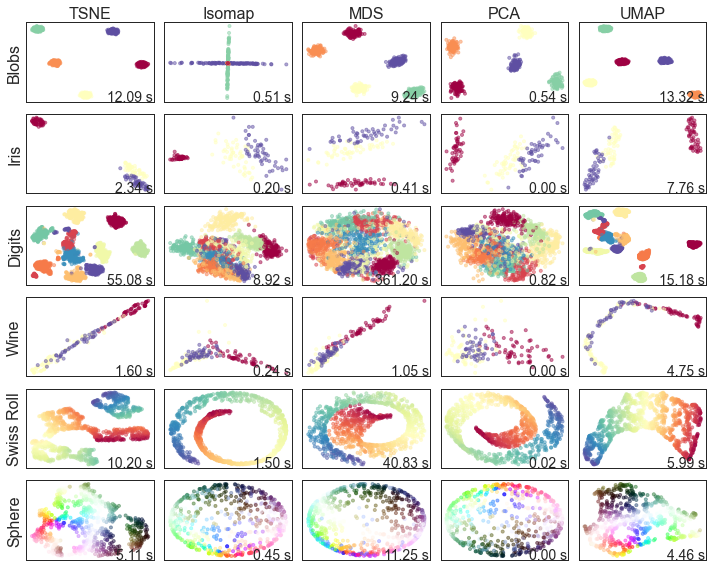

In [54]:
n_rows = len(test_data)
n_cols = len(reducers)
ax_index = 1
ax_list = []

# plt.figure(figsize=(9 * 2 + 3, 12.5))
plt.figure(figsize=(10, 8))
plt.subplots_adjust(
    left=0.02, right=0.98, bottom=0.001, top=0.96, wspace=0.05, hspace=0.01
)
for data, labels in test_data:
    for reducer, args in reducers:
        start_time = time.time()
        embedding = reducer(n_components=2, **args).fit_transform(data)
        elapsed_time = time.time() - start_time
        ax = plt.subplot(n_rows, n_cols, ax_index)
        if isinstance(labels[0], tuple):
            ax.scatter(*embedding.T, s=10, c=labels, alpha=0.5)
        else:
            ax.scatter(*embedding.T, s=10, c=labels, cmap="Spectral", alpha=0.5)
        ax.text(
            0.99,
            0.01,
            "{:.2f} s".format(elapsed_time),
            transform=ax.transAxes,
            size=14,
            horizontalalignment="right",
        )
        ax_list.append(ax)
        ax_index += 1
plt.setp(ax_list, xticks=[], yticks=[])

for i in np.arange(n_rows) * n_cols:
    ax_list[i].set_ylabel(dataset_names[i // n_cols], size=16)
for i in range(n_cols):
    ax_list[i].set_xlabel(repr(reducers[i][0]()).split("(")[0], size=16)
    ax_list[i].xaxis.set_label_position("top")

plt.tight_layout()
plt.show()

Agora vamos comparar `UMAP` e `tSNE` em diferentes conjuntos de dados.

In [55]:
%matplotlib inline
sns.set(style='white', rc={'figure.figsize':(12, 10)})

from matplotlib.gridspec import GridSpec

In [56]:
coil_umap = pd.read_csv('https://raw.githubusercontent.com/lmcinnes/umap_paper_notebooks/master/embedding_coil20_umap1.csv')
mnist_umap = pd.read_csv('https://raw.githubusercontent.com/lmcinnes/umap_paper_notebooks/master/embedding_mnist_umap1.csv')
fmnist_umap = pd.read_csv('https://raw.githubusercontent.com/lmcinnes/umap_paper_notebooks/master/embedding_fashion_mnist_umap1.csv')
words_umap = pd.read_csv('https://raw.githubusercontent.com/lmcinnes/umap_paper_notebooks/master/embedding_word_200_umap1.csv')

coil_tsne = pd.read_csv('https://raw.githubusercontent.com/lmcinnes/umap_paper_notebooks/master/embedding_coil20_tsne1.csv')
mnist_tsne = pd.read_csv('https://raw.githubusercontent.com/lmcinnes/umap_paper_notebooks/master/embedding_mnist_tsne1.csv')
fmnist_tsne = pd.read_csv('https://raw.githubusercontent.com/lmcinnes/umap_paper_notebooks/master/embedding_fashion_mnist_tsne1.csv')
words_tsne = pd.read_csv('https://raw.githubusercontent.com/lmcinnes/umap_paper_notebooks/master/embedding_word_200_tsne1.csv')

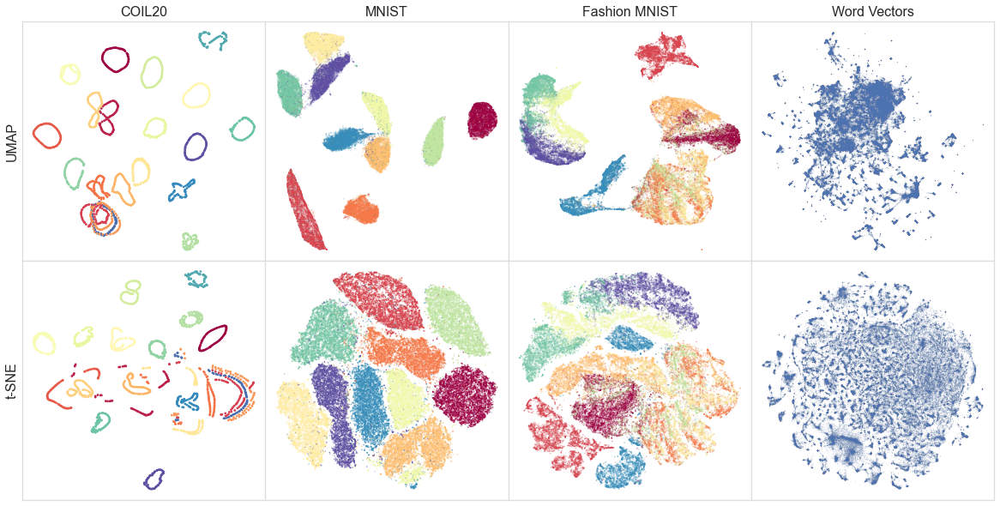

In [57]:
with plt.rc_context({'axes.edgecolor':'#dddddd'}):
    fig = plt.figure(figsize=(16, 8))
    umap_coil_ax = fig.add_subplot(241)
    tsne_coil_ax = fig.add_subplot(245)
    umap_mnist_ax = fig.add_subplot(242)
    tsne_mnist_ax = fig.add_subplot(246)
    umap_fmnist_ax = fig.add_subplot(243)
    tsne_fmnist_ax = fig.add_subplot(247)
    umap_words_ax = fig.add_subplot(244)
    tsne_words_ax = fig.add_subplot(248)
    axes = [umap_coil_ax, tsne_coil_ax, 
            umap_mnist_ax, tsne_mnist_ax,
            umap_fmnist_ax, tsne_fmnist_ax,
            umap_words_ax, tsne_words_ax]

    umap_coil_ax.scatter(coil_umap.x, coil_umap.y, s=3, 
                         c=coil_umap['labels'], cmap='Spectral')
    tsne_coil_ax.scatter(coil_tsne.x, coil_tsne.y, s=3, 
                         c=coil_tsne['labels'], cmap='Spectral')
    umap_mnist_ax.scatter(mnist_umap.x, mnist_umap.y, s=0.02, 
                          c=mnist_umap['labels'], cmap='Spectral')
    tsne_mnist_ax.scatter(mnist_tsne.x, mnist_tsne.y, s=0.05, 
                          c=mnist_tsne['labels'], cmap='Spectral')
    umap_fmnist_ax.scatter(fmnist_umap.x, fmnist_umap.y, s=0.02, 
                           c=fmnist_umap['labels'], cmap='Spectral')
    tsne_fmnist_ax.scatter(fmnist_tsne.x, fmnist_tsne.y, s=0.02, 
                           c=fmnist_tsne['labels'], cmap='Spectral')
    umap_words_ax.scatter(words_umap.x, words_umap.y, s=0.001)
    tsne_words_ax.scatter(words_tsne.x, words_tsne.y, s=0.001)

    plt.setp(axes, xticks=[], yticks=[])

    umap_coil_ax.set_ylabel('UMAP', fontsize=16)
    tsne_coil_ax.set_ylabel('t-SNE', fontsize=16)

    umap_coil_ax.set_title('COIL20', fontsize=16)
    umap_mnist_ax.set_title('MNIST', fontsize=16)
    umap_fmnist_ax.set_title('Fashion MNIST', fontsize=16)
    umap_words_ax.set_title('Word Vectors', fontsize=16)
    plt.tight_layout(pad=0.0)
    plt.savefig('UMAP-TSNE-comparison.png')

A tabela a seguir, retirada do artigo original, apresenta uma comparação da acurácia entre diferentes algoritmos com a variação do número de vizinhos mais próximo considerado.

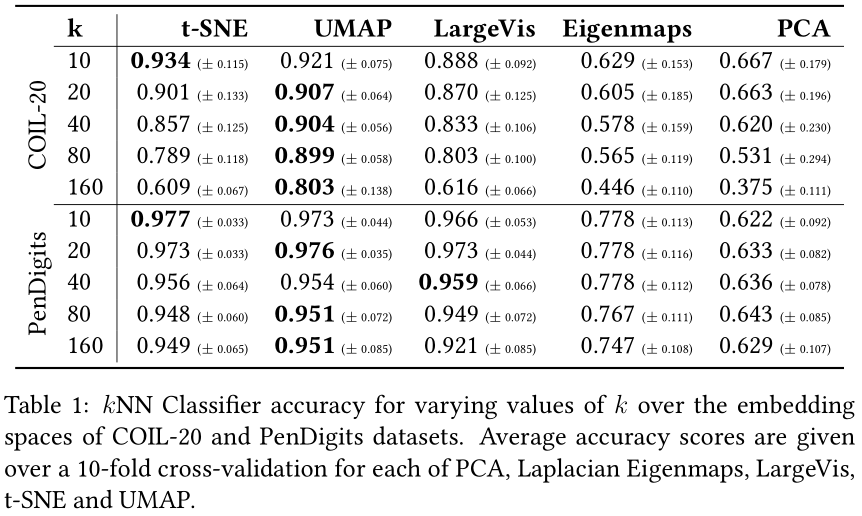

In [58]:
Image("images/tabela1.png")

A tabela a seguir, retirada do artigo original, apresenta uma comparação do tempo de execução de diversos algoritmos para alguns conjuntos de dados.

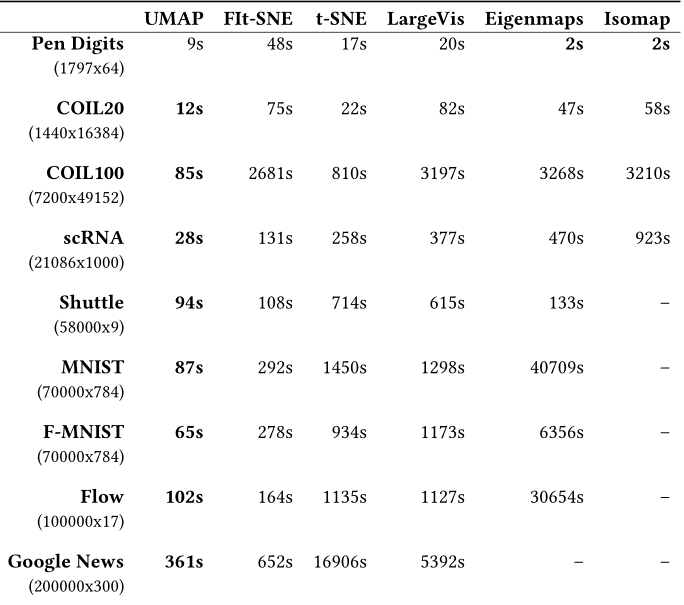

In [59]:
Image("images/tabela3.png")

O gráfico a seguir, retirado do artigo original, apresenta uma comparação do tempo de execução dos algoritmos `UMAP`, `tSNE` e `LargeVis` para diferentes dimensões de mergulho.

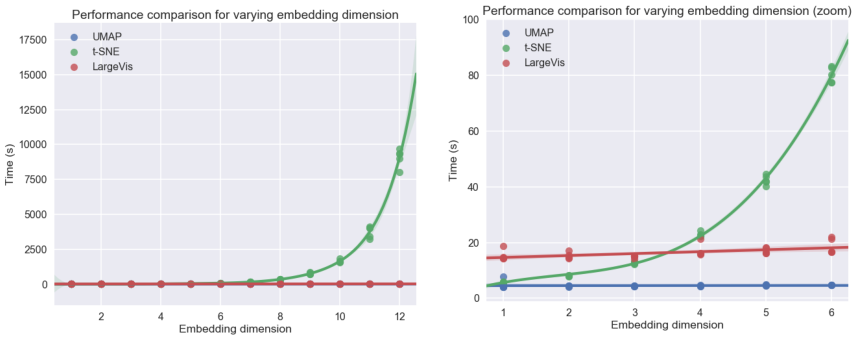

In [60]:
Image("images/figure9_paper.png")

Podemos observar que `UMAP` é um algoritmo muito mais rápido que os demais, especialmente para dimensões muito grande. Parte dos motivos que o levam a ser mais rápido já foram expostas.

Em [[1]](https://arxiv.org/abs/1802.03426) ainda pode-se encontrar mais referências que apontam mais comparações entre os algoritmos.

### Desvantagens / Quando não usa UMAP

Como pode-se notar, `UMAP` é um bom algoritmo de redução de dimensionalidade, mas é claro que não é perfeito e não deve ser aplicado sempre. Vejamos alguns pontos de atenção ao usar `UMAP` ou quando não usá-lo:

* As dimensões obtidas no espaço projetado não possuem interpretação. Portanto, se interpretabilidade é algo crucial, deve-se usar outro algoritmo como, por exemplo, `PCA` que permite encontrar variáveis que contém a maior variabilidade dos dados e, num certo sentido, a informação relevante dos dados. 


* Para pequenos conjuntos de dados ou dados com muito ruído, `UMAP` pode não encontrar a estrutura correta da variedade sobre a qual os dados estão por conta de relações espúrias. A medida que a quantidade de observações aumenta `UMAP` deve funcionar melhor. Devido as aproximações feitas para garantir melhor performance computacional, conjunto de dados com menos de 500 observações devem sofrer impacto maior e os resultados com `UMAP` podem não ser confiáveis.


* Apesar de `UMAP` levar em conta tanto a estrutura local quando a global, a maior atenção é dada a estrutura local, pois é nesta que todo o algoritmo se baseia. Portanto, se a estrutura global for o principal objeto de interesse, talvez `UMAP` não seja a melhor escolha.


* `UMAP` usa métricas locais mas se fundamenta na preservação da topologia dos dados. Se a métrica original deve ser preservada, então `UMAP` não é a melhor escolha.

### Referências

[[1]](https://arxiv.org/abs/1802.03426) McInnes, Leland & Healy, John., UMAP: Uniform Manifold Approximation and Projection for Dimension Reduction. 2018

Também foi usada uma [palestra](https://www.youtube.com/watch?v=nq6iPZVUxZU&t=720s) do autor e adaptações de códigos do seu [GitHub](https://github.com/lmcinnes).

[[2]](https://lvdmaaten.github.io/publications/papers/JMLR_2008.pdf) Maaten, Laurens van der & Hinton, Geoffrey, Visualizing Data using t-SNE. Journal of Machine Learning Research 9 (2008).

Assim como também foi usada a documentação oficial https://umap-learn.readthedocs.io/en/latest/ e publicações de Nikolay Oskolkov [[3]](https://towardsdatascience.com/tsne-vs-umap-global-structure-4d8045acba17), [[4]](https://towardsdatascience.com/why-umap-is-superior-over-tsne-faa039c28e99), [[5]](https://towardsdatascience.com/how-exactly-umap-works-13e3040e1668) e [[6]](https://towardsdatascience.com/how-to-program-umap-from-scratch-e6eff67f55fe) no blog https://towardsdatascience.com.

O site [Understanding UMAP](https://pair-code.github.io/understanding-umap/) contém um material muito bom para entendimento de como os hiperparâmetros do algoritmo afetam seu resultado.

Rhys, Hefin I., Machine Learning with R, the tidyverse, and mlr. Manning. 2020.